# Road Lane Segmentation - Data Loading and Visualization
This notebook demonstrates loading and visualizing road lane segmentation data from Kaggle for training an image segmentation model.

---



In [ ]:
# Import all required libraries
import kagglehub
import cv2
import matplotlib.pyplot as plt
import os
import numpy as np
from pathlib import Path
from typing import Tuple, List
import random
import time

# Set plotting style
plt.style.use('seaborn-v0_8-darkgrid')
%matplotlib inline

## 1. Import Libraries and Download Dataset

In [ ]:
# Download dataset from Kaggle
path = kagglehub.dataset_download("princekhunt19/road-lane-segmentation-imgs-and-labels")
print(f"Dataset downloaded to: {path}")
print(f"Root contents: {os.listdir(path)}")

100%|██████████| 104M/104M [00:05<00:00, 19.3MB/s]

Extracting files...


Dataset downloaded to: /root/.cache/kagglehub/datasets/princekhunt19/road-lane-segmentation-imgs-and-labels/versions/1
Root contents: ['dataset']


In [ ]:
# Set dataset root path dynamically
if 'path' in locals():
    # Use the downloaded path
    DATASET_ROOT = path
    # Check if 'dataset' subdirectory exists
    if os.path.exists(os.path.join(path, "dataset")):
        DATASET_ROOT = os.path.join(path, "dataset")
else:
    # Fallback path
    DATASET_ROOT = "/root/.cache/kagglehub/datasets/princekhunt19/road-lane-segmentation-imgs-and-labels/versions/1/dataset"

# Define paths
train_images = os.path.join(DATASET_ROOT, "train", "images")
train_labels = os.path.join(DATASET_ROOT, "train", "labels")
val_images = os.path.join(DATASET_ROOT, "val", "images") if os.path.exists(os.path.join(DATASET_ROOT, "val")) else None
val_labels = os.path.join(DATASET_ROOT, "val", "labels") if os.path.exists(os.path.join(DATASET_ROOT, "val")) else None

print(f"Dataset Root: {DATASET_ROOT}")
print(f"Train Images: {train_images}")
print(f"Train Labels: {train_labels}")
print(f"\nChecking paths exist:")
print(f"  Root exists: {os.path.exists(DATASET_ROOT)}")
print(f"  Train images exist: {os.path.exists(train_images)}")
print(f"  Train labels exist: {os.path.exists(train_labels)}")

Dataset Root: /root/.cache/kagglehub/datasets/princekhunt19/road-lane-segmentation-imgs-and-labels/versions/1/dataset
Train Images: /root/.cache/kagglehub/datasets/princekhunt19/road-lane-segmentation-imgs-and-labels/versions/1/dataset/train/images
Train Labels: /root/.cache/kagglehub/datasets/princekhunt19/road-lane-segmentation-imgs-and-labels/versions/1/dataset/train/labels

Checking paths exist:
  Root exists: True
  Train images exist: True
  Train labels exist: True


In [ ]:
# Verify dataset structure
def verify_dataset_structure(root_path):
    """Verify and display dataset structure."""
    print(f"{'='*60}")
    print(f"Dataset Structure Verification")
    print(f"{'='*60}\n")

    if not os.path.exists(root_path):
        print(f" Root path not found: {root_path}")
        return False

    print(f"✓ Root path exists: {root_path}")
    print(f"  Contents: {os.listdir(root_path)}\n")

    # Check train directory
    train_path = os.path.join(root_path, "train")
    if os.path.exists(train_path):
        print(f"✓ Train directory exists")
        train_contents = os.listdir(train_path)
        print(f"  Contents: {train_contents}")

        # Count images and labels
        img_path = os.path.join(train_path, "images")
        lbl_path = os.path.join(train_path, "labels")

        if os.path.exists(img_path):
            num_images = len([f for f in os.listdir(img_path) if f.endswith(('.jpg', '.png', '.jpeg'))])
            print(f"  Images: {num_images}")

        if os.path.exists(lbl_path):
            num_labels = len([f for f in os.listdir(lbl_path) if f.endswith('.txt')])
            print(f"  Labels: {num_labels}")

    print(f"\n{'='*60}")
    return True

verify_dataset_structure(DATASET_ROOT)

Dataset Structure Verification

✓ Root path exists: /root/.cache/kagglehub/datasets/princekhunt19/road-lane-segmentation-imgs-and-labels/versions/1/dataset
  Contents: ['val', 'test', 'dataset.yaml', 'train']

✓ Train directory exists
  Contents: ['labels', 'images']
  Images: 815
  Labels: 815



True

## 5. Visualize Single Sample (Detailed View)

In [ ]:
def visualize_single_sample(img: np.ndarray, mask: np.ndarray, filename: str = ""):
    """
    Visualize single image with mask and overlay.

    Args:
        img: RGB image
        mask: Binary segmentation mask
        filename: Optional filename for title
    """
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    # Original image
    axes[0].imshow(img)
    axes[0].set_title(f"Original Image\n{filename}", fontsize=12, fontweight='bold')
    axes[0].axis('off')

    # Segmentation mask
    axes[1].imshow(mask, cmap='gray')
    axes[1].set_title("Segmentation Mask", fontsize=12, fontweight='bold')
    axes[1].axis('off')

    # Overlay
    overlay = img.copy()
    overlay[mask > 0] = overlay[mask > 0] * 0.5 + np.array([255, 0, 0]) * 0.5
    axes[2].imshow(overlay.astype(np.uint8))
    axes[2].set_title("Image + Mask Overlay", fontsize=12, fontweight='bold')
    axes[2].axis('off')

    plt.tight_layout()
    plt.show()

    # Print statistics
    mask_percentage = (mask > 0).sum() / mask.size * 100
    print(f"Image shape: {img.shape}")
    print(f"Mask coverage: {mask_percentage:.2f}% of image")
    print(f"Lane pixels: {(mask > 0).sum():,}")


def visualize_multiple_samples(image_dir: str, label_dir: str, n_samples: int = 6):
    """
    Visualize multiple samples in a grid.

    Args:
        image_dir: Directory containing images
        label_dir: Directory containing labels
        n_samples: Number of samples to display
    """
    sample_files = get_sample_files(image_dir, n_samples)

    fig, axes = plt.subplots(n_samples, 3, figsize=(15, 5 * n_samples))

    if n_samples == 1:
        axes = axes.reshape(1, -1)

    for idx, filename in enumerate(sample_files):
        try:
            img, mask = load_image_and_mask(image_dir, label_dir, filename)

            # Original image
            axes[idx, 0].imshow(img)
            axes[idx, 0].set_title(f"Image: {filename}", fontsize=10)
            axes[idx, 0].axis('off')

            # Mask
            axes[idx, 1].imshow(mask, cmap='gray')
            axes[idx, 1].set_title("Mask", fontsize=10)
            axes[idx, 1].axis('off')

            # Overlay
            overlay = img.copy()
            overlay[mask > 0] = overlay[mask > 0] * 0.6 + np.array([0, 255, 0]) * 0.4
            axes[idx, 2].imshow(overlay.astype(np.uint8))
            axes[idx, 2].set_title("Overlay", fontsize=10)
            axes[idx, 2].axis('off')

        except Exception as e:
            print(f"Error loading {filename}: {e}")
            for ax in axes[idx]:
                ax.axis('off')

    plt.tight_layout()
    plt.show()


def plot_dataset_statistics(image_dir: str, label_dir: str, n_samples: int = 100):
    """
    Plot statistics about the dataset.

    Args:
        image_dir: Directory containing images
        label_dir: Directory containing labels
        n_samples: Number of samples to analyze
    """
    sample_files = get_sample_files(image_dir, n_samples)

    mask_coverages = []
    image_sizes = []

    for filename in sample_files:
        try:
            img, mask = load_image_and_mask(image_dir, label_dir, filename)
            coverage = (mask > 0).sum() / mask.size * 100
            mask_coverages.append(coverage)
            image_sizes.append(img.shape[:2])
        except:
            continue

    # Create statistics plots
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    # Mask coverage distribution
    axes[0].hist(mask_coverages, bins=20, color='steelblue', edgecolor='black', alpha=0.7)
    axes[0].set_xlabel('Mask Coverage (%)', fontsize=12)
    axes[0].set_ylabel('Frequency', fontsize=12)
    axes[0].set_title('Distribution of Mask Coverage', fontsize=14, fontweight='bold')
    axes[0].axvline(np.mean(mask_coverages), color='red', linestyle='--',
                     label=f'Mean: {np.mean(mask_coverages):.2f}%')
    axes[0].legend()
    axes[0].grid(alpha=0.3)

    # Image dimensions
    heights, widths = zip(*image_sizes)
    axes[1].scatter(widths, heights, alpha=0.6, color='coral', edgecolor='black')
    axes[1].set_xlabel('Width (pixels)', fontsize=12)
    axes[1].set_ylabel('Height (pixels)', fontsize=12)
    axes[1].set_title('Image Dimensions', fontsize=14, fontweight='bold')
    axes[1].grid(alpha=0.3)

    plt.tight_layout()
    plt.show()

    print(f"\n{'='*60}")
    print(f"Dataset Statistics (based on {len(mask_coverages)} samples)")
    print(f"{'='*60}")
    print(f"Mask Coverage - Mean: {np.mean(mask_coverages):.2f}%, Std: {np.std(mask_coverages):.2f}%")
    print(f"Image Dimensions - Most common: {max(set(image_sizes), key=image_sizes.count)}")
    print(f"{'='*60}")

## 4. Enhanced Visualization Functions

In [ ]:
def load_yolo_mask(label_path: str, img_shape: Tuple[int, int]) -> np.ndarray:
    """
    Load YOLO segmentation annotation and convert to binary mask.

    Args:
        label_path: Path to YOLO .txt annotation file
        img_shape: Tuple of (height, width) for the image

    Returns:
        Binary mask as numpy array
    """
    h, w = img_shape
    mask = np.zeros((h, w), dtype=np.uint8)

    if not os.path.exists(label_path):
        return mask

    with open(label_path, 'r') as f:
        lines = f.readlines()

    for line in lines:
        parts = line.strip().split()
        if len(parts) < 3:  # Need at least class_id + 1 point
            continue

        # Parse coordinates (skip class_id at parts[0])
        coords = np.array([float(x) for x in parts[1:]])

        # Reshape to (N, 2) points
        points = coords.reshape(-1, 2)

        # Denormalize coordinates
        points[:, 0] *= w
        points[:, 1] *= h
        points = points.astype(np.int32)

        # Draw filled polygon
        cv2.fillPoly(mask, [points], 255)

    return mask


def load_image_and_mask(image_dir: str, label_dir: str, filename: str) -> Tuple[np.ndarray, np.ndarray]:
    """
    Load image and corresponding segmentation mask.

    Args:
        image_dir: Directory containing images
        label_dir: Directory containing YOLO label files
        filename: Image filename

    Returns:
        Tuple of (image, mask)
    """
    # Load image
    img_path = os.path.join(image_dir, filename)
    img = cv2.imread(img_path)

    if img is None:
        raise ValueError(f"Failed to load image: {img_path}")

    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w = img.shape[:2]

    # Load mask
    label_filename = os.path.splitext(filename)[0] + ".txt"
    label_path = os.path.join(label_dir, label_filename)
    mask = load_yolo_mask(label_path, (h, w))

    return img_rgb, mask


def get_sample_files(image_dir: str, n: int = 6, random_seed: int = 42) -> List[str]:
    """
    Get random sample of image filenames.

    Args:
        image_dir: Directory containing images
        n: Number of samples
        random_seed: Random seed for reproducibility

    Returns:
        List of image filenames
    """
    all_files = [f for f in os.listdir(image_dir) if f.endswith(('.jpg', '.png', '.jpeg'))]
    random.seed(random_seed)
    return random.sample(all_files, min(n, len(all_files)))

## 3. Data Loading Utilities

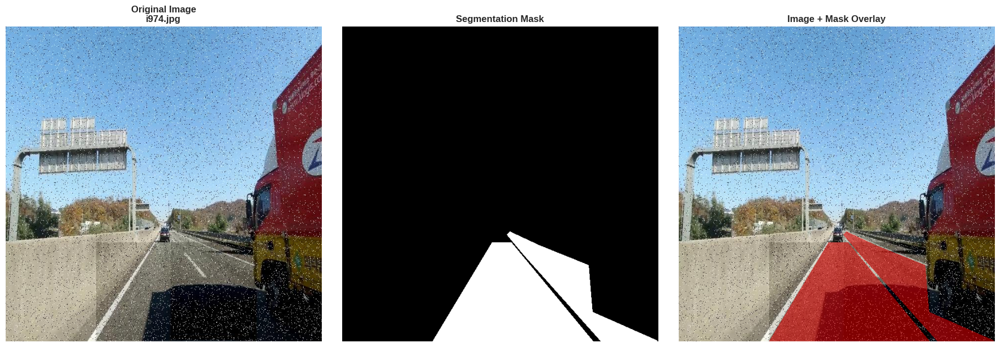

Image shape: (640, 640, 3)
Mask coverage: 12.83% of image
Lane pixels: 52,538


In [ ]:
# Load and visualize a single sample with detailed view
sample_filename = os.listdir(train_images)[0]
img, mask = load_image_and_mask(train_images, train_labels, sample_filename)
visualize_single_sample(img, mask, sample_filename)

In [ ]:
class SegmentationDataset:
    """
    Dataset class for image segmentation.
    Ready to be integrated with PyTorch or TensorFlow.
    """
    def __init__(self, image_dir: str, label_dir: str, transform=None):
        self.image_dir = image_dir
        self.label_dir = label_dir
        self.transform = transform
        self.image_files = [f for f in os.listdir(image_dir)
                           if f.endswith(('.jpg', '.png', '.jpeg'))]

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        filename = self.image_files[idx]
        img, mask = load_image_and_mask(self.image_dir, self.label_dir, filename)

        if self.transform:
            # Apply transformations (augmentations)
            transformed = self.transform(image=img, mask=mask)
            img = transformed['image']
            mask = transformed['mask']

        return img, mask, filename

    def get_stats(self):
        """Get dataset statistics."""
        print(f"Dataset Statistics:")
        print(f"  Total samples: {len(self)}")
        print(f"  Image directory: {self.image_dir}")
        print(f"  Label directory: {self.label_dir}")

        # Sample image to get dimensions
        if len(self) > 0:
            img, mask, _ = self[0]
            print(f"  Sample image shape: {img.shape}")
            print(f"  Sample mask shape: {mask.shape}")

# Create dataset instance
train_dataset = SegmentationDataset(train_images, train_labels)
train_dataset.get_stats()

print("\n✓ Dataset is ready for model training!")
print("  Next steps:")
print("  - Apply data augmentation (rotation, flipping, scaling)")
print("  - Normalize images (mean/std normalization)")
print("  - Create train/val split if needed")
print("  - Build PyTorch DataLoader or TensorFlow Dataset")

Dataset Statistics:
  Total samples: 815
  Image directory: /root/.cache/kagglehub/datasets/princekhunt19/road-lane-segmentation-imgs-and-labels/versions/1/dataset/train/images
  Label directory: /root/.cache/kagglehub/datasets/princekhunt19/road-lane-segmentation-imgs-and-labels/versions/1/dataset/train/labels
  Sample image shape: (640, 640, 3)
  Sample mask shape: (640, 640)

✓ Dataset is ready for model training!
  Next steps:
  - Apply data augmentation (rotation, flipping, scaling)
  - Normalize images (mean/std normalization)
  - Create train/val split if needed
  - Build PyTorch DataLoader or TensorFlow Dataset


## 8. Data Preparation for Model Training

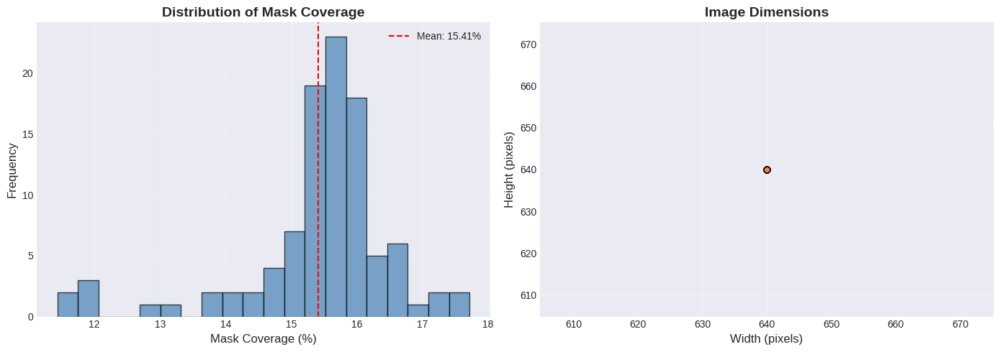


Dataset Statistics (based on 100 samples)
Mask Coverage - Mean: 15.41%, Std: 1.15%
Image Dimensions - Most common: (640, 640)


In [ ]:
# Analyze dataset statistics
plot_dataset_statistics(train_images, train_labels, n_samples=100)

## 7. Dataset Statistics and Analysis

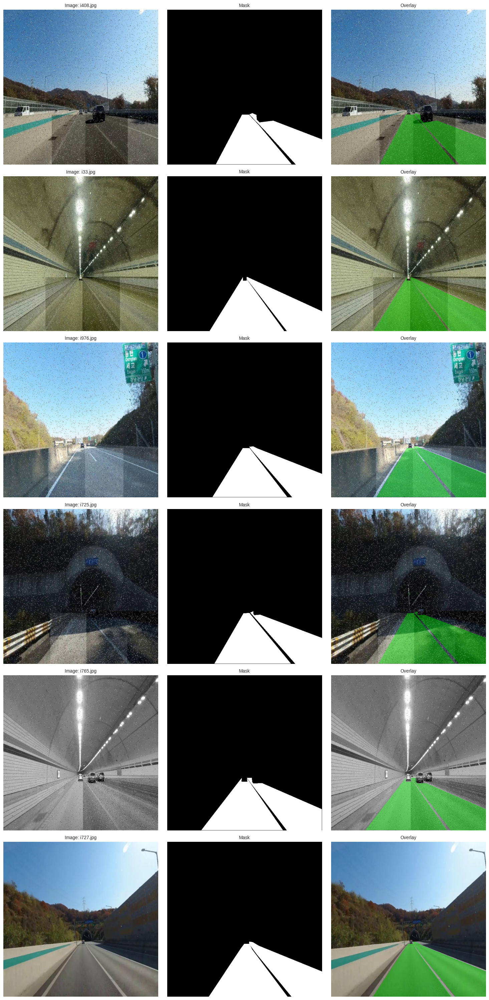

In [ ]:
# Visualize multiple samples in a grid
visualize_multiple_samples(train_images, train_labels, n_samples=6)

---

# **Complete Image Segmentation Pipeline**

This section implements an end-to-end pipeline from data preprocessing to model evaluation.

## **Step 1: Data Preprocessing & Augmentation**

**Goal**: Standardize image sizes and apply augmentations to improve model generalization.

**Key Techniques**:
- Resize all images to 512×512 (balance between detail and computational cost)
- Normalize pixel values using ImageNet statistics
- Use **Albumentations** library for synchronized image-mask augmentation
- Apply augmentations: flips, rotations, brightness/contrast adjustments

In [ ]:
import albumentations as A
from albumentations.pytorch import ToTensorV2
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split

print("Augmentation libraries loaded successfully")

Augmentation libraries loaded successfully


In [ ]:
!pip install albumentations torch torchvision segmentation-models-pytorch -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 10.6 MB/s eta 0:00:00


In [ ]:
# Define augmentation pipelines
IMG_SIZE = 512
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD = [0.229, 0.224, 0.225]

# Training augmentations (aggressive)
train_transform = A.Compose([
    A.Resize(IMG_SIZE, IMG_SIZE),
    A.HorizontalFlip(p=0.5),
    A.ShiftScaleRotate(shift_limit=0.1, scale_limit=0.2, rotate_limit=15, p=0.5),
    A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=0.5),
    A.GaussNoise(var_limit=(10.0, 50.0), p=0.3),
    A.GaussianBlur(blur_limit=(3, 5), p=0.3),
    A.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
    ToTensorV2()
])

# Validation augmentations (minimal - only resize and normalize)
val_transform = A.Compose([
    A.Resize(IMG_SIZE, IMG_SIZE),
    A.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
    ToTensorV2()
])

print(" Augmentation pipelines configured")
print(f"  Target image size: {IMG_SIZE}×{IMG_SIZE}")
print(f"  Training augmentations: {len(train_transform)} operations")
print(f"  Validation augmentations: {len(val_transform)} operations")

 Augmentation pipelines configured
  Target image size: 512×512
  Training augmentations: 8 operations
  Validation augmentations: 3 operations


/usr/local/lib/python3.12/dist-packages/albumentations/core/validation.py:114: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)
/tmp/ipython-input-2792132139.py:12: UserWarning: Argument(s) 'var_limit' are not valid for transform GaussNoise
  A.GaussNoise(var_limit=(10.0, 50.0), p=0.3),


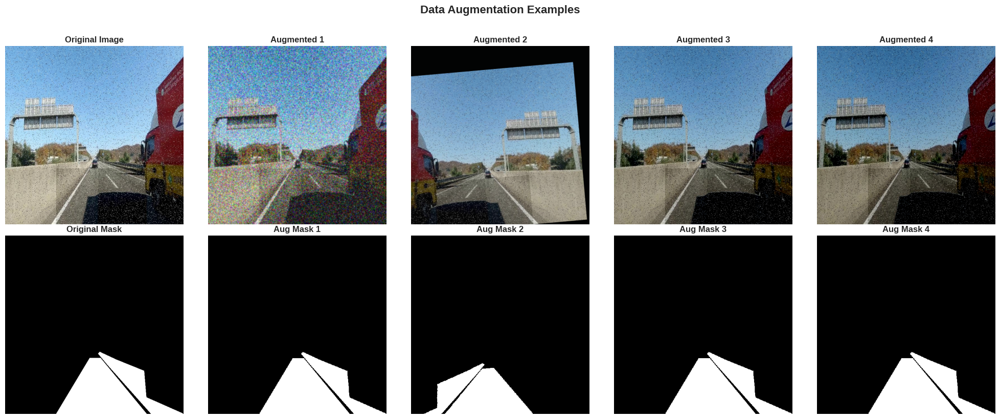

 Insight: Augmentations help the model learn robust features invariant to:
   - Horizontal flips (left/right lane positions)
   - Rotations (camera angles)
   - Brightness/contrast (different lighting conditions)
   - Noise and blur (realistic image artifacts)


In [ ]:
# Visualize augmentations on a sample image
def visualize_augmentations(image_dir, label_dir, n_augmentations=4):
    """Show original image and augmented versions."""
    # Get a sample
    filename = os.listdir(image_dir)[0]
    img, mask = load_image_and_mask(image_dir, label_dir, filename)

    fig, axes = plt.subplots(2, n_augmentations + 1, figsize=(20, 8))

    # Original
    axes[0, 0].imshow(img)
    axes[0, 0].set_title("Original Image", fontweight='bold')
    axes[0, 0].axis('off')

    axes[1, 0].imshow(mask, cmap='gray')
    axes[1, 0].set_title("Original Mask", fontweight='bold')
    axes[1, 0].axis('off')

    # Augmented versions
    for i in range(n_augmentations):
        augmented = train_transform(image=img, mask=mask)
        aug_img = augmented['image'].permute(1, 2, 0).numpy()
        aug_mask = augmented['mask'].numpy()

        # Denormalize for visualization
        aug_img = aug_img * np.array(IMAGENET_STD) + np.array(IMAGENET_MEAN)
        aug_img = np.clip(aug_img, 0, 1)

        axes[0, i + 1].imshow(aug_img)
        axes[0, i + 1].set_title(f"Augmented {i+1}", fontweight='bold')
        axes[0, i + 1].axis('off')

        axes[1, i + 1].imshow(aug_mask, cmap='gray')
        axes[1, i + 1].set_title(f"Aug Mask {i+1}", fontweight='bold')
        axes[1, i + 1].axis('off')

    plt.suptitle("Data Augmentation Examples", fontsize=16, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.show()

    print(" Insight: Augmentations help the model learn robust features invariant to:")
    print("   - Horizontal flips (left/right lane positions)")
    print("   - Rotations (camera angles)")
    print("   - Brightness/contrast (different lighting conditions)")
    print("   - Noise and blur (realistic image artifacts)")

visualize_augmentations(train_images, train_labels, n_augmentations=4)

## **Step 2: Train/Validation/Test Split**

**Strategy**: 70% train, 15% validation, 15% test
- **Training set**: Learn model parameters
- **Validation set**: Tune hyperparameters and monitor overfitting
- **Test set**: Final evaluation (untouched during training)

Dataset Split Summary
Total images: 815
  Training:    570 (69.9%)
  Validation:  122 (15.0%)
  Test:        123 (15.1%)


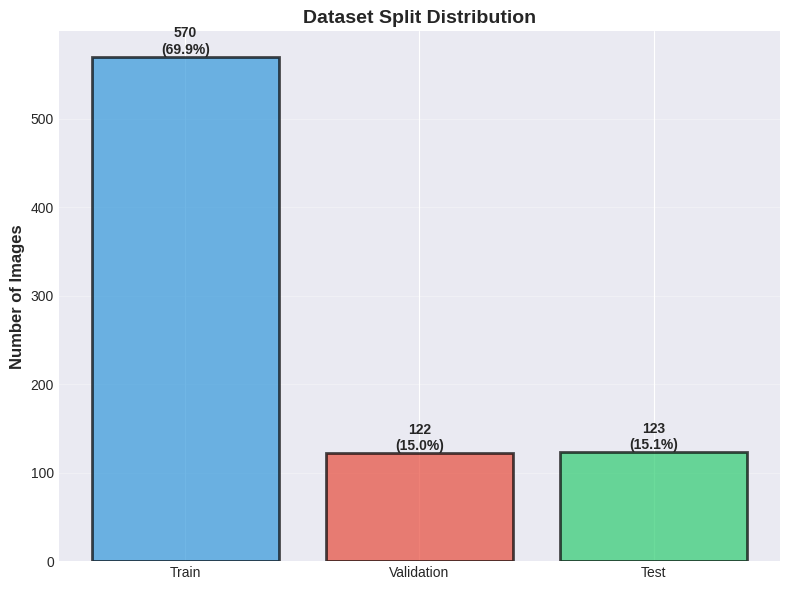


 Insight: Proper data splitting prevents overfitting and ensures unbiased evaluation


In [ ]:
# Get all image files and split
all_image_files = sorted([f for f in os.listdir(train_images) if f.endswith(('.jpg', '.png', '.jpeg'))])

# First split: 70% train, 30% temp
train_files, temp_files = train_test_split(all_image_files, test_size=0.3, random_state=42)

# Second split: 15% val, 15% test (from the 30% temp)
val_files, test_files = train_test_split(temp_files, test_size=0.5, random_state=42)

# Display split statistics
print(f"{'='*60}")
print(f"Dataset Split Summary")
print(f"{'='*60}")
print(f"Total images: {len(all_image_files)}")
print(f"  Training:   {len(train_files):4d} ({len(train_files)/len(all_image_files)*100:.1f}%)")
print(f"  Validation: {len(val_files):4d} ({len(val_files)/len(all_image_files)*100:.1f}%)")
print(f"  Test:       {len(test_files):4d} ({len(test_files)/len(all_image_files)*100:.1f}%)")
print(f"{'='*60}")

# Visualize split proportions
fig, ax = plt.subplots(figsize=(8, 6))
splits = ['Train', 'Validation', 'Test']
counts = [len(train_files), len(val_files), len(test_files)]
colors = ['#3498db', '#e74c3c', '#2ecc71']

bars = ax.bar(splits, counts, color=colors, alpha=0.7, edgecolor='black', linewidth=2)
ax.set_ylabel('Number of Images', fontsize=12, fontweight='bold')
ax.set_title('Dataset Split Distribution', fontsize=14, fontweight='bold')
ax.grid(axis='y', alpha=0.3)

# Add count labels on bars
for bar, count in zip(bars, counts):
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2., height,
            f'{count}\n({count/len(all_image_files)*100:.1f}%)',
            ha='center', va='bottom', fontweight='bold')

plt.tight_layout()
plt.show()

print("\n Insight: Proper data splitting prevents overfitting and ensures unbiased evaluation")

## **Step 3: Create PyTorch Dataset & DataLoaders**

**Implementation**: Custom PyTorch Dataset with efficient data loading
- Batch processing for GPU efficiency
- Multi-worker data loading for faster training
- Separate transforms for train/val/test

In [ ]:
class RoadLaneDataset(Dataset):
    """PyTorch Dataset for Road Lane Segmentation."""

    def __init__(self, image_dir, label_dir, file_list, transform=None):
        self.image_dir = image_dir
        self.label_dir = label_dir
        self.file_list = file_list
        self.transform = transform

    def __len__(self):
        return len(self.file_list)

    def __getitem__(self, idx):
        filename = self.file_list[idx]

        # Load image and mask
        img, mask = load_image_and_mask(self.image_dir, self.label_dir, filename)

        # Apply transformations
        if self.transform:
            augmented = self.transform(image=img, mask=mask)
            img = augmented['image']
            mask = augmented['mask']

        # Convert mask to float and normalize to [0, 1]
        mask = mask.float() / 255.0
        mask = mask.unsqueeze(0)  # Add channel dimension

        return img, mask

# Create datasets
train_dataset = RoadLaneDataset(train_images, train_labels, train_files, transform=train_transform)
val_dataset = RoadLaneDataset(train_images, train_labels, val_files, transform=val_transform)
test_dataset = RoadLaneDataset(train_images, train_labels, test_files, transform=val_transform)

# Create dataloaders
BATCH_SIZE = 8
NUM_WORKERS = 0
# num_workers=0 [for train_loader and val_loader]
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True,
                         num_workers=NUM_WORKERS, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False,
                       num_workers=NUM_WORKERS, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False,
                        num_workers=NUM_WORKERS, pin_memory=True)

print(f" DataLoaders created successfully")
print(f"  Batch size: {BATCH_SIZE}")
print(f"  Train batches: {len(train_loader)}")
print(f"  Val batches: {len(val_loader)}")
print(f"  Test batches: {len(test_loader)}")

# Test dataloader
sample_batch = next(iter(train_loader))
print(f"\n Sample batch shapes:")
print(f"  Images: {sample_batch[0].shape} [Batch, Channels, Height, Width]")
print(f"  Masks: {sample_batch[1].shape} [Batch, 1, Height, Width]")

 DataLoaders created successfully
  Batch size: 8
  Train batches: 72
  Val batches: 16
  Test batches: 16

 Sample batch shapes:
  Images: torch.Size([8, 3, 512, 512]) [Batch, Channels, Height, Width]
  Masks: torch.Size([8, 1, 512, 512]) [Batch, 1, Height, Width]


## **Step 4: Model Architecture Selection**

**Chosen Model**: **U-Net with ResNet34 Encoder**

**Why U-Net?**
-  Industry standard for medical/semantic segmentation
-  Skip connections preserve spatial information
-  Efficient encoder-decoder architecture
-  Pre-trained encoders available (ImageNet)

**Why ResNet34?**
-  Good balance between accuracy and speed
-  21M parameters (lighter than ResNet50)
-  Proven performance on segmentation tasks

In [ ]:
!pip install segmentation_models_pytorch

In [ ]:
import segmentation_models_pytorch as smp

# Create U-Net model with ResNet34 encoder
model = smp.Unet(
    encoder_name="resnet34",        # Encoder architecture
    encoder_weights="imagenet",      # Use ImageNet pre-trained weights
    in_channels=3,                   # RGB input
    classes=1,                       # Binary segmentation (lane vs background)
    activation=None                  # We'll apply sigmoid in loss function
)

# Move model to GPU if available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device)

# Count parameters
total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

print(f" Model created successfully")
print(f"  Architecture: U-Net with ResNet34 encoder")
print(f"  Device: {device}")
print(f"  Total parameters: {total_params:,}")
print(f"  Trainable parameters: {trainable_params:,}")
print(f"  Model size: ~{total_params * 4 / 1024 / 1024:.1f} MB")

# Visualize model architecture (simplified)
print(f"\n U-Net Architecture:")
print(f"  Encoder (ResNet34): Downsampling path")
print(f"    → Block 1: 64 filters")
print(f"    → Block 2: 128 filters")
print(f"    → Block 3: 256 filters")
print(f"    → Block 4: 512 filters")
print(f"  Bottleneck: 512 filters")
print(f"  Decoder: Upsampling path with skip connections")
print(f"    → Concatenates encoder features at each level")
print(f"    → Recovers spatial resolution")
print(f"  Output: 1 channel (lane probability map)")

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/156 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/87.3M [00:00<?, ?B/s]

 Model created successfully
  Architecture: U-Net with ResNet34 encoder
  Device: cuda
  Total parameters: 24,436,369
  Trainable parameters: 24,436,369
  Model size: ~93.2 MB

 U-Net Architecture:
  Encoder (ResNet34): Downsampling path
    → Block 1: 64 filters
    → Block 2: 128 filters
    → Block 3: 256 filters
    → Block 4: 512 filters
  Bottleneck: 512 filters
  Decoder: Upsampling path with skip connections
    → Concatenates encoder features at each level
    → Recovers spatial resolution
  Output: 1 channel (lane probability map)


## **Step 5: Loss Function & Metrics**

**Loss Function**: **Combined BCE-Dice Loss**
- BCE (Binary Cross-Entropy): Pixel-wise classification
- Dice Loss: Overlap-based, handles class imbalance
- Combined: `0.5 × BCE + 0.5 × Dice`

**Metrics**: IoU (Intersection over Union) and Dice Coefficient

✓ Loss function and metrics configured
  Loss: Combined BCE-Dice Loss (0.5 + 0.5)
  Metrics: IoU (Jaccard Index) & Dice Coefficient


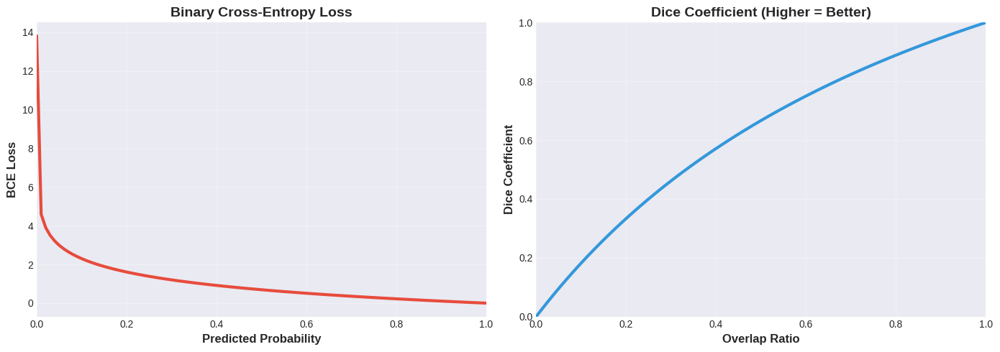


 Insight:
  - BCE penalizes confident wrong predictions heavily
  - Dice focuses on overlap, good for imbalanced datasets
  - Combined loss balances both objectives


In [ ]:
class DiceLoss(nn.Module):
    """Dice Loss for segmentation."""
    def __init__(self, smooth=1e-6):
        super(DiceLoss, self).__init__()
        self.smooth = smooth

    def forward(self, pred, target):
        pred = torch.sigmoid(pred)
        pred = pred.view(-1)
        target = target.view(-1)

        intersection = (pred * target).sum()
        dice = (2. * intersection + self.smooth) / (pred.sum() + target.sum() + self.smooth)

        return 1 - dice

class CombinedLoss(nn.Module):
    """Combined BCE + Dice Loss."""
    def __init__(self, bce_weight=0.5, dice_weight=0.5):
        super(CombinedLoss, self).__init__()
        self.bce = nn.BCEWithLogitsLoss()
        self.dice = DiceLoss()
        self.bce_weight = bce_weight
        self.dice_weight = dice_weight

    def forward(self, pred, target):
        bce_loss = self.bce(pred, target)
        dice_loss = self.dice(pred, target)
        return self.bce_weight * bce_loss + self.dice_weight * dice_loss

def calculate_iou(pred, target, threshold=0.5):
    """Calculate Intersection over Union."""
    pred = (torch.sigmoid(pred) > threshold).float()
    intersection = (pred * target).sum()
    union = pred.sum() + target.sum() - intersection
    iou = (intersection + 1e-6) / (union + 1e-6)
    return iou.item()

def calculate_dice(pred, target, threshold=0.5):
    """Calculate Dice coefficient."""
    pred = (torch.sigmoid(pred) > threshold).float()
    intersection = (pred * target).sum()
    dice = (2. * intersection + 1e-6) / (pred.sum() + target.sum() + 1e-6)
    return dice.item()

# Initialize loss function
criterion = CombinedLoss()

print("✓ Loss function and metrics configured")
print(f"  Loss: Combined BCE-Dice Loss (0.5 + 0.5)")
print(f"  Metrics: IoU (Jaccard Index) & Dice Coefficient")

# Visualize loss concept
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# BCE Loss illustration
x = np.linspace(0, 1, 100)
bce = -np.log(x + 1e-6)
axes[0].plot(x, bce, linewidth=3, color='#e74c3c')
axes[0].set_xlabel('Predicted Probability', fontsize=12, fontweight='bold')
axes[0].set_ylabel('BCE Loss', fontsize=12, fontweight='bold')
axes[0].set_title('Binary Cross-Entropy Loss', fontsize=14, fontweight='bold')
axes[0].grid(alpha=0.3)
axes[0].set_xlim(0, 1)

# Dice coefficient illustration
overlap = np.linspace(0, 1, 100)
dice = 2 * overlap / (1 + overlap)
axes[1].plot(overlap, dice, linewidth=3, color='#3498db')
axes[1].set_xlabel('Overlap Ratio', fontsize=12, fontweight='bold')
axes[1].set_ylabel('Dice Coefficient', fontsize=12, fontweight='bold')
axes[1].set_title('Dice Coefficient (Higher = Better)', fontsize=14, fontweight='bold')
axes[1].grid(alpha=0.3)
axes[1].set_xlim(0, 1)
axes[1].set_ylim(0, 1)

plt.tight_layout()
plt.show()

print("\n Insight:")
print("  - BCE penalizes confident wrong predictions heavily")
print("  - Dice focuses on overlap, good for imbalanced datasets")
print("  - Combined loss balances both objectives")

## **Step 6: Training Configuration**

**Optimizer**: AdamW (Adam with weight decay for better generalization)
**Learning Rate**: 1e-4 with ReduceLROnPlateau scheduler
**Epochs**: 30 with early stopping (patience=7)

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt

 Training configuration set
  Optimizer: AdamW
  Learning rate: 0.0001
  Weight decay: 1e-05
  Epochs: 30
  Early stopping patience: 7
  LR scheduler: ReduceLROnPlateau (factor=0.5, patience=3)


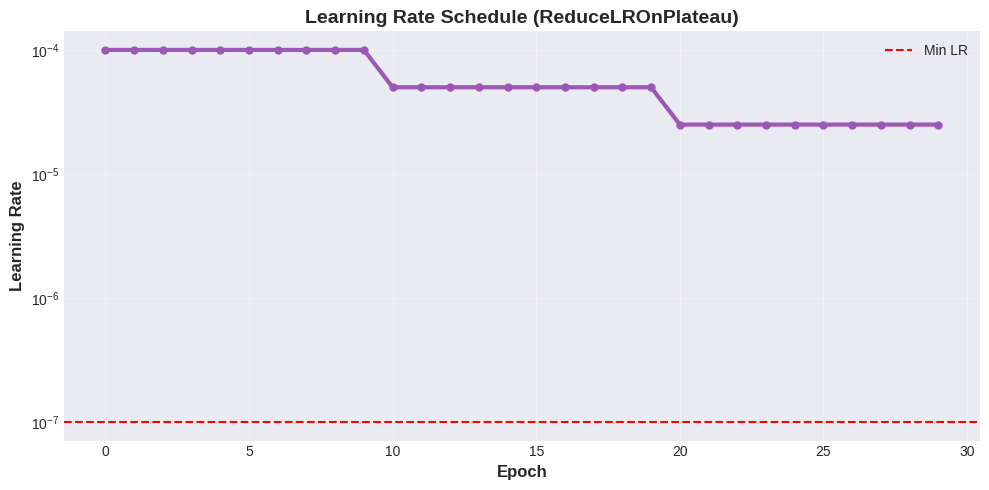


 Insight: Adaptive learning rate helps fine-tune as training progresses


In [ ]:
# Training hyperparameters
LEARNING_RATE = 1e-4
WEIGHT_DECAY = 1e-5
NUM_EPOCHS = 30
EARLY_STOP_PATIENCE = 7

# Optimizer with weight decay
optimizer = torch.optim.AdamW(model.parameters(), lr=LEARNING_RATE, weight_decay=WEIGHT_DECAY)

# Learning rate scheduler (reduce on plateau)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min',
    factor=0.5,
    patience=3,
    # verbose=True,
    min_lr=1e-7
)

print(f" Training configuration set")
print(f"  Optimizer: AdamW")
print(f"  Learning rate: {LEARNING_RATE}")
print(f"  Weight decay: {WEIGHT_DECAY}")
print(f"  Epochs: {NUM_EPOCHS}")
print(f"  Early stopping patience: {EARLY_STOP_PATIENCE}")
print(f"  LR scheduler: ReduceLROnPlateau (factor=0.5, patience=3)")

# Visualize learning rate schedule concept
fig, ax = plt.subplots(figsize=(10, 5))

epochs_example = np.arange(30)
lr_example = np.array([LEARNING_RATE] * 30)
# Simulate plateaus
lr_example[10:] *= 0.5
lr_example[20:] *= 0.5

ax.plot(epochs_example, lr_example, linewidth=3, color='#9b59b6', marker='o', markersize=5)
ax.set_xlabel('Epoch', fontsize=12, fontweight='bold')
ax.set_ylabel('Learning Rate', fontsize=12, fontweight='bold')
ax.set_title('Learning Rate Schedule (ReduceLROnPlateau)', fontsize=14, fontweight='bold')
ax.set_yscale('log')
ax.grid(alpha=0.3)
ax.axhline(y=1e-7, color='r', linestyle='--', label='Min LR')
ax.legend()

plt.tight_layout()
plt.show()

print("\n Insight: Adaptive learning rate helps fine-tune as training progresses")

## **Step 7: Training Loop Implementation**

**Features**:
- Progress tracking with metrics logging
- Early stopping to prevent overfitting
- Model checkpointing (save best model)
- Real-time visualization of training progress

In [ ]:
from tqdm.auto import tqdm
import time

def train_epoch(model, loader, criterion, optimizer, device):
    """Train for one epoch."""
    model.train()
    running_loss = 0.0
    running_iou = 0.0
    running_dice = 0.0

    pbar = tqdm(loader, desc='Training', leave=False)
    for images, masks in pbar:
        images, masks = images.to(device), masks.to(device)

        # Forward pass
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, masks)

        # Backward pass
        loss.backward()
        optimizer.step()

        # Metrics
        running_loss += loss.item()
        running_iou += calculate_iou(outputs, masks)
        running_dice += calculate_dice(outputs, masks)

        # Update progress bar
        pbar.set_postfix({'loss': f'{loss.item():.4f}'})

    epoch_loss = running_loss / len(loader)
    epoch_iou = running_iou / len(loader)
    epoch_dice = running_dice / len(loader)

    return epoch_loss, epoch_iou, epoch_dice

def validate_epoch(model, loader, criterion, device):
    """Validate for one epoch."""
    model.eval()
    running_loss = 0.0
    running_iou = 0.0
    running_dice = 0.0

    with torch.no_grad():
        pbar = tqdm(loader, desc='Validation', leave=False)
        for images, masks in pbar:
            images, masks = images.to(device), masks.to(device)

            outputs = model(images)
            loss = criterion(outputs, masks)

            running_loss += loss.item()
            running_iou += calculate_iou(outputs, masks)
            running_dice += calculate_dice(outputs, masks)

            pbar.set_postfix({'loss': f'{loss.item():.4f}'})

    epoch_loss = running_loss / len(loader)
    epoch_iou = running_iou / len(loader)
    epoch_dice = running_dice / len(loader)

    return epoch_loss, epoch_iou, epoch_dice

# Training history storage
history = {
    'train_loss': [], 'train_iou': [], 'train_dice': [],
    'val_loss': [], 'val_iou': [], 'val_dice': []
}

print(" Training functions defined")
print("  Ready to start training loop")

 Training functions defined
  Ready to start training loop


In [ ]:
# Main training loop
best_val_iou = 0.0
early_stop_counter = 0
start_time = time.time()

print(f"{'='*70}")
print(f"Starting Training")
print(f"{'='*70}\n")

for epoch in range(NUM_EPOCHS):
    print(f"Epoch {epoch+1}/{NUM_EPOCHS}")
    print(f"-" * 70)

    # Train
    train_loss, train_iou, train_dice = train_epoch(model, train_loader, criterion, optimizer, device)

    # Validate
    val_loss, val_iou, val_dice = validate_epoch(model, val_loader, criterion, device)

    # Update scheduler
    scheduler.step(val_loss)

    # Store history
    history['train_loss'].append(train_loss)
    history['train_iou'].append(train_iou)
    history['train_dice'].append(train_dice)
    history['val_loss'].append(val_loss)
    history['val_iou'].append(val_iou)
    history['val_dice'].append(val_dice)

    # Print metrics
    print(f"Train Loss: {train_loss:.4f} | IoU: {train_iou:.4f} | Dice: {train_dice:.4f}")
    print(f"Val   Loss: {val_loss:.4f} | IoU: {val_iou:.4f} | Dice: {val_dice:.4f}")

    # Save best model
    if val_iou > best_val_iou:
        best_val_iou = val_iou
        torch.save(model.state_dict(), 'best_model.pth')
        print(f"✓ Model saved! (Best Val IoU: {best_val_iou:.4f})")
        early_stop_counter = 0
    else:
        early_stop_counter += 1

    # Early stopping
    if early_stop_counter >= EARLY_STOP_PATIENCE:
        print(f"\n⚠ Early stopping triggered after {epoch+1} epochs")
        break

    print()

training_time = time.time() - start_time
print(f"\n{'='*70}")
print(f"Training Complete!")
print(f"{'='*70}")
print(f"Total training time: {training_time/60:.2f} minutes")
print(f"Best validation IoU: {best_val_iou:.4f}")
print(f"Model saved to: best_model.pth")

Starting Training

Epoch 1/30
----------------------------------------------------------------------


Training:   0%|          | 0/72 [00:00<?, ?it/s]

Validation:   0%|          | 0/16 [00:00<?, ?it/s]

Train Loss: 0.4803 | IoU: 0.5682 | Dice: 0.7048
Val   Loss: 0.3311 | IoU: 0.7866 | Dice: 0.8804
✓ Model saved! (Best Val IoU: 0.7866)

Epoch 2/30
----------------------------------------------------------------------


Training:   0%|          | 0/72 [00:00<?, ?it/s]

Validation:   0%|          | 0/16 [00:00<?, ?it/s]

Train Loss: 0.2902 | IoU: 0.7836 | Dice: 0.8776
Val   Loss: 0.2089 | IoU: 0.8722 | Dice: 0.9315
✓ Model saved! (Best Val IoU: 0.8722)

Epoch 3/30
----------------------------------------------------------------------


Training:   0%|          | 0/72 [00:00<?, ?it/s]

Validation:   0%|          | 0/16 [00:00<?, ?it/s]

Train Loss: 0.2087 | IoU: 0.8251 | Dice: 0.9034
Val   Loss: 0.1610 | IoU: 0.8712 | Dice: 0.9310

Epoch 4/30
----------------------------------------------------------------------


Training:   0%|          | 0/72 [00:00<?, ?it/s]

Validation:   0%|          | 0/16 [00:00<?, ?it/s]

Train Loss: 0.1649 | IoU: 0.8527 | Dice: 0.9196
Val   Loss: 0.1215 | IoU: 0.9010 | Dice: 0.9478
✓ Model saved! (Best Val IoU: 0.9010)

Epoch 5/30
----------------------------------------------------------------------


Training:   0%|          | 0/72 [00:00<?, ?it/s]

Validation:   0%|          | 0/16 [00:00<?, ?it/s]

Train Loss: 0.1352 | IoU: 0.8679 | Dice: 0.9286
Val   Loss: 0.1023 | IoU: 0.9121 | Dice: 0.9540
✓ Model saved! (Best Val IoU: 0.9121)

Epoch 6/30
----------------------------------------------------------------------


Training:   0%|          | 0/72 [00:00<?, ?it/s]

Validation:   0%|          | 0/16 [00:00<?, ?it/s]

Train Loss: 0.1159 | IoU: 0.8747 | Dice: 0.9324
Val   Loss: 0.0866 | IoU: 0.9151 | Dice: 0.9555
✓ Model saved! (Best Val IoU: 0.9151)

Epoch 7/30
----------------------------------------------------------------------


Training:   0%|          | 0/72 [00:00<?, ?it/s]

Validation:   0%|          | 0/16 [00:00<?, ?it/s]

Train Loss: 0.1018 | IoU: 0.8816 | Dice: 0.9364
Val   Loss: 0.0694 | IoU: 0.9301 | Dice: 0.9637
✓ Model saved! (Best Val IoU: 0.9301)

Epoch 8/30
----------------------------------------------------------------------


Training:   0%|          | 0/72 [00:00<?, ?it/s]

Validation:   0%|          | 0/16 [00:00<?, ?it/s]

Train Loss: 0.0828 | IoU: 0.9037 | Dice: 0.9491
Val   Loss: 0.0602 | IoU: 0.9390 | Dice: 0.9685
✓ Model saved! (Best Val IoU: 0.9390)

Epoch 9/30
----------------------------------------------------------------------


Training:   0%|          | 0/72 [00:00<?, ?it/s]

Validation:   0%|          | 0/16 [00:00<?, ?it/s]

Train Loss: 0.0801 | IoU: 0.8976 | Dice: 0.9456
Val   Loss: 0.0535 | IoU: 0.9406 | Dice: 0.9693
✓ Model saved! (Best Val IoU: 0.9406)

Epoch 10/30
----------------------------------------------------------------------


Training:   0%|          | 0/72 [00:00<?, ?it/s]

Validation:   0%|          | 0/16 [00:00<?, ?it/s]

Train Loss: 0.0743 | IoU: 0.8996 | Dice: 0.9467
Val   Loss: 0.0512 | IoU: 0.9388 | Dice: 0.9684

Epoch 11/30
----------------------------------------------------------------------


Training:   0%|          | 0/72 [00:00<?, ?it/s]

Validation:   0%|          | 0/16 [00:00<?, ?it/s]

Train Loss: 0.0611 | IoU: 0.9207 | Dice: 0.9583
Val   Loss: 0.0479 | IoU: 0.9384 | Dice: 0.9681

Epoch 12/30
----------------------------------------------------------------------


Training:   0%|          | 0/72 [00:00<?, ?it/s]

Validation:   0%|          | 0/16 [00:00<?, ?it/s]

Train Loss: 0.0623 | IoU: 0.9115 | Dice: 0.9534
Val   Loss: 0.0507 | IoU: 0.9299 | Dice: 0.9635

Epoch 13/30
----------------------------------------------------------------------


Training:   0%|          | 0/72 [00:00<?, ?it/s]

Validation:   0%|          | 0/16 [00:00<?, ?it/s]

Train Loss: 0.0574 | IoU: 0.9160 | Dice: 0.9558
Val   Loss: 0.0373 | IoU: 0.9525 | Dice: 0.9757
✓ Model saved! (Best Val IoU: 0.9525)

Epoch 14/30
----------------------------------------------------------------------


Training:   0%|          | 0/72 [00:00<?, ?it/s]

Validation:   0%|          | 0/16 [00:00<?, ?it/s]

Train Loss: 0.0526 | IoU: 0.9224 | Dice: 0.9594
Val   Loss: 0.0408 | IoU: 0.9431 | Dice: 0.9707

Epoch 15/30
----------------------------------------------------------------------


Training:   0%|          | 0/72 [00:00<?, ?it/s]

Validation:   0%|          | 0/16 [00:00<?, ?it/s]

Train Loss: 0.0460 | IoU: 0.9323 | Dice: 0.9648
Val   Loss: 0.0365 | IoU: 0.9478 | Dice: 0.9731

Epoch 16/30
----------------------------------------------------------------------


Training:   0%|          | 0/72 [00:00<?, ?it/s]

Validation:   0%|          | 0/16 [00:00<?, ?it/s]

Train Loss: 0.0468 | IoU: 0.9284 | Dice: 0.9627
Val   Loss: 0.0357 | IoU: 0.9494 | Dice: 0.9740

Epoch 17/30
----------------------------------------------------------------------


Training:   0%|          | 0/72 [00:00<?, ?it/s]

Validation:   0%|          | 0/16 [00:00<?, ?it/s]

Train Loss: 0.0459 | IoU: 0.9272 | Dice: 0.9620
Val   Loss: 0.0402 | IoU: 0.9379 | Dice: 0.9679

Epoch 18/30
----------------------------------------------------------------------


Training:   0%|          | 0/72 [00:00<?, ?it/s]

Validation:   0%|          | 0/16 [00:00<?, ?it/s]

Train Loss: 0.0451 | IoU: 0.9269 | Dice: 0.9619
Val   Loss: 0.0315 | IoU: 0.9528 | Dice: 0.9758
✓ Model saved! (Best Val IoU: 0.9528)

Epoch 19/30
----------------------------------------------------------------------


Training:   0%|          | 0/72 [00:00<?, ?it/s]

Validation:   0%|          | 0/16 [00:00<?, ?it/s]

Train Loss: 0.0461 | IoU: 0.9243 | Dice: 0.9603
Val   Loss: 0.0365 | IoU: 0.9430 | Dice: 0.9706

Epoch 20/30
----------------------------------------------------------------------


Training:   0%|          | 0/72 [00:00<?, ?it/s]

Validation:   0%|          | 0/16 [00:00<?, ?it/s]

Train Loss: 0.0430 | IoU: 0.9282 | Dice: 0.9626
Val   Loss: 0.0276 | IoU: 0.9576 | Dice: 0.9783
✓ Model saved! (Best Val IoU: 0.9576)

Epoch 21/30
----------------------------------------------------------------------


Training:   0%|          | 0/72 [00:00<?, ?it/s]

Validation:   0%|          | 0/16 [00:00<?, ?it/s]

Train Loss: 0.0372 | IoU: 0.9383 | Dice: 0.9681
Val   Loss: 0.0257 | IoU: 0.9602 | Dice: 0.9797
✓ Model saved! (Best Val IoU: 0.9602)

Epoch 22/30
----------------------------------------------------------------------


Training:   0%|          | 0/72 [00:00<?, ?it/s]

Validation:   0%|          | 0/16 [00:00<?, ?it/s]

Train Loss: 0.0389 | IoU: 0.9345 | Dice: 0.9660
Val   Loss: 0.0396 | IoU: 0.9387 | Dice: 0.9679

Epoch 23/30
----------------------------------------------------------------------


Training:   0%|          | 0/72 [00:00<?, ?it/s]

Validation:   0%|          | 0/16 [00:00<?, ?it/s]

Train Loss: 0.0385 | IoU: 0.9351 | Dice: 0.9663
Val   Loss: 0.0261 | IoU: 0.9581 | Dice: 0.9786

Epoch 24/30
----------------------------------------------------------------------


Training:   0%|          | 0/72 [00:00<?, ?it/s]

Validation:   0%|          | 0/16 [00:00<?, ?it/s]

Train Loss: 0.0373 | IoU: 0.9360 | Dice: 0.9667
Val   Loss: 0.0290 | IoU: 0.9523 | Dice: 0.9755

Epoch 25/30
----------------------------------------------------------------------


Training:   0%|          | 0/72 [00:00<?, ?it/s]

Validation:   0%|          | 0/16 [00:00<?, ?it/s]

Train Loss: 0.0384 | IoU: 0.9326 | Dice: 0.9648
Val   Loss: 0.0254 | IoU: 0.9583 | Dice: 0.9787

Epoch 26/30
----------------------------------------------------------------------


Training:   0%|          | 0/72 [00:00<?, ?it/s]

Validation:   0%|          | 0/16 [00:00<?, ?it/s]

Train Loss: 0.0336 | IoU: 0.9415 | Dice: 0.9697
Val   Loss: 0.0235 | IoU: 0.9612 | Dice: 0.9802
✓ Model saved! (Best Val IoU: 0.9612)

Epoch 27/30
----------------------------------------------------------------------


Training:   0%|          | 0/72 [00:00<?, ?it/s]

Validation:   0%|          | 0/16 [00:00<?, ?it/s]

Train Loss: 0.0382 | IoU: 0.9320 | Dice: 0.9646
Val   Loss: 0.0257 | IoU: 0.9565 | Dice: 0.9777

Epoch 28/30
----------------------------------------------------------------------


Training:   0%|          | 0/72 [00:00<?, ?it/s]

Validation:   0%|          | 0/16 [00:00<?, ?it/s]

Train Loss: 0.0344 | IoU: 0.9398 | Dice: 0.9689
Val   Loss: 0.0243 | IoU: 0.9607 | Dice: 0.9799

Epoch 29/30
----------------------------------------------------------------------


Training:   0%|          | 0/72 [00:00<?, ?it/s]

Validation:   0%|          | 0/16 [00:00<?, ?it/s]

Train Loss: 0.0351 | IoU: 0.9371 | Dice: 0.9673
Val   Loss: 0.0241 | IoU: 0.9578 | Dice: 0.9784

Epoch 30/30
----------------------------------------------------------------------


Training:   0%|          | 0/72 [00:00<?, ?it/s]

Validation:   0%|          | 0/16 [00:00<?, ?it/s]

Train Loss: 0.0340 | IoU: 0.9390 | Dice: 0.9684
Val   Loss: 0.0248 | IoU: 0.9580 | Dice: 0.9785


Training Complete!
Total training time: 21.27 minutes
Best validation IoU: 0.9612
Model saved to: best_model.pth


## **Step 8: Training Visualization & Analysis**

Visualize training curves to understand model learning behavior and detect overfitting.

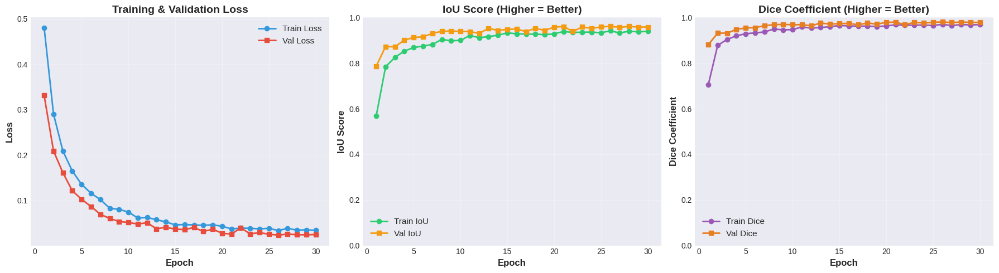


Training Analysis
Final Training IoU:   0.9390
Final Validation IoU: 0.9580
Train-Val Gap:        -0.0190
 Model generalization: EXCELLENT (minimal overfitting)

 Insights:
  - Loss should decrease steadily
  - IoU/Dice should increase over epochs
  - Small train-val gap indicates good generalization
  - If val loss increases while train decreases → overfitting


In [ ]:
# Plot training history
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

epochs_range = range(1, len(history['train_loss']) + 1)

# Loss curve
axes[0].plot(epochs_range, history['train_loss'], 'o-', label='Train Loss', linewidth=2, markersize=6, color='#3498db')
axes[0].plot(epochs_range, history['val_loss'], 's-', label='Val Loss', linewidth=2, markersize=6, color='#e74c3c')
axes[0].set_xlabel('Epoch', fontsize=12, fontweight='bold')
axes[0].set_ylabel('Loss', fontsize=12, fontweight='bold')
axes[0].set_title('Training & Validation Loss', fontsize=14, fontweight='bold')
axes[0].legend(fontsize=11)
axes[0].grid(alpha=0.3)

# IoU curve
axes[1].plot(epochs_range, history['train_iou'], 'o-', label='Train IoU', linewidth=2, markersize=6, color='#2ecc71')
axes[1].plot(epochs_range, history['val_iou'], 's-', label='Val IoU', linewidth=2, markersize=6, color='#f39c12')
axes[1].set_xlabel('Epoch', fontsize=12, fontweight='bold')
axes[1].set_ylabel('IoU Score', fontsize=12, fontweight='bold')
axes[1].set_title('IoU Score (Higher = Better)', fontsize=14, fontweight='bold')
axes[1].legend(fontsize=11)
axes[1].grid(alpha=0.3)
axes[1].set_ylim(0, 1)

# Dice curve
axes[2].plot(epochs_range, history['train_dice'], 'o-', label='Train Dice', linewidth=2, markersize=6, color='#9b59b6')
axes[2].plot(epochs_range, history['val_dice'], 's-', label='Val Dice', linewidth=2, markersize=6, color='#e67e22')
axes[2].set_xlabel('Epoch', fontsize=12, fontweight='bold')
axes[2].set_ylabel('Dice Coefficient', fontsize=12, fontweight='bold')
axes[2].set_title('Dice Coefficient (Higher = Better)', fontsize=14, fontweight='bold')
axes[2].legend(fontsize=11)
axes[2].grid(alpha=0.3)
axes[2].set_ylim(0, 1)

plt.tight_layout()
plt.show()

# Training insights
final_train_iou = history['train_iou'][-1]
final_val_iou = history['val_iou'][-1]
overfitting_gap = final_train_iou - final_val_iou

print(f"\n{'='*70}")
print(f"Training Analysis")
print(f"{'='*70}")
print(f"Final Training IoU:   {final_train_iou:.4f}")
print(f"Final Validation IoU: {final_val_iou:.4f}")
print(f"Train-Val Gap:        {overfitting_gap:.4f}")

if overfitting_gap < 0.05:
    print(f" Model generalization: EXCELLENT (minimal overfitting)")
elif overfitting_gap < 0.10:
    print(f" Model generalization: GOOD")
elif overfitting_gap < 0.15:
    print(f" Model generalization: FAIR (some overfitting)")
else:
    print(f" Model generalization: POOR (significant overfitting)")

print(f"{'='*70}")

print("\n Insights:")
print("  - Loss should decrease steadily")
print("  - IoU/Dice should increase over epochs")
print("  - Small train-val gap indicates good generalization")
print("  - If val loss increases while train decreases → overfitting")

## **Step 9: Model Evaluation on Test Set**

Evaluate the trained model on the held-out test set for final performance assessment.

✓ Best model loaded from checkpoint



Validation:   0%|          | 0/16 [00:00<?, ?it/s]

Test Set Evaluation
Test Loss: 0.0290
Test IoU:  0.9539
Test Dice: 0.9763


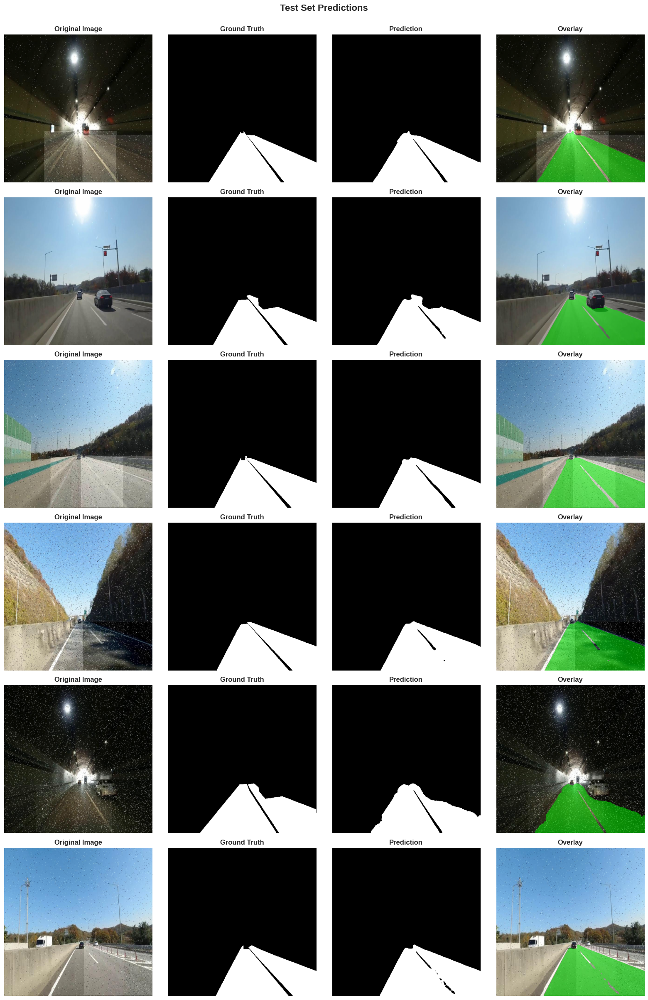


 Insight: Compare predicted masks with ground truth to identify:
  - False positives (model predicts lane where there isn't one)
  - False negatives (model misses actual lane regions)
  - Edge accuracy (how well boundaries are detected)


In [ ]:
# Load best model
model.load_state_dict(torch.load('best_model.pth'))
print("✓ Best model loaded from checkpoint\n")

# Evaluate on test set
test_loss, test_iou, test_dice = validate_epoch(model, test_loader, criterion, device)

print(f"{'='*70}")
print(f"Test Set Evaluation")
print(f"{'='*70}")
print(f"Test Loss: {test_loss:.4f}")
print(f"Test IoU:  {test_iou:.4f}")
print(f"Test Dice: {test_dice:.4f}")
print(f"{'='*70}")

# Visualize test predictions
def visualize_predictions(model, loader, device, n_samples=6):
    """Visualize model predictions on test samples."""
    model.eval()

    fig, axes = plt.subplots(n_samples, 4, figsize=(16, 4 * n_samples))

    with torch.no_grad():
        images, masks = next(iter(loader))
        images, masks = images.to(device), masks.to(device)
        outputs = model(images)
        preds = torch.sigmoid(outputs) > 0.5

        for i in range(min(n_samples, images.shape[0])):
            # Denormalize image for visualization
            img = images[i].cpu().permute(1, 2, 0).numpy()
            img = img * np.array(IMAGENET_STD) + np.array(IMAGENET_MEAN)
            img = np.clip(img, 0, 1)

            mask_true = masks[i, 0].cpu().numpy()
            mask_pred = preds[i, 0].cpu().numpy()

            # Original image
            axes[i, 0].imshow(img)
            axes[i, 0].set_title('Original Image', fontweight='bold')
            axes[i, 0].axis('off')

            # Ground truth
            axes[i, 1].imshow(mask_true, cmap='gray')
            axes[i, 1].set_title('Ground Truth', fontweight='bold')
            axes[i, 1].axis('off')

            # Prediction
            axes[i, 2].imshow(mask_pred, cmap='gray')
            axes[i, 2].set_title('Prediction', fontweight='bold')
            axes[i, 2].axis('off')

            # Overlay
            overlay = img.copy()
            overlay[mask_pred > 0.5] = overlay[mask_pred > 0.5] * 0.5 + np.array([0, 1, 0]) * 0.5
            axes[i, 3].imshow(overlay)
            axes[i, 3].set_title('Overlay', fontweight='bold')
            axes[i, 3].axis('off')

    plt.suptitle('Test Set Predictions', fontsize=16, fontweight='bold', y=1.001)
    plt.tight_layout()
    plt.show()

visualize_predictions(model, test_loader, device, n_samples=6)

print("\n Insight: Compare predicted masks with ground truth to identify:")
print("  - False positives (model predicts lane where there isn't one)")
print("  - False negatives (model misses actual lane regions)")
print("  - Edge accuracy (how well boundaries are detected)")

## **Step 10: Inference Pipeline & Deployment Preparation**

Create an easy-to-use inference function for making predictions on new images.

Testing inference on: i128.jpg



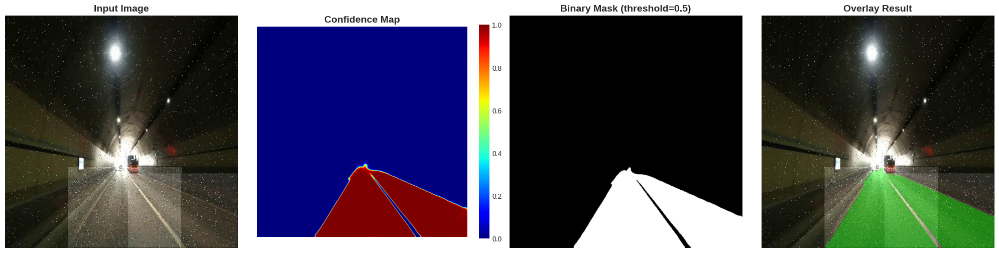

 Inference Statistics:
  Lane coverage: 15.74% of image
  Average confidence: 0.991
  Image size: (640, 640)

 Deployment Insights:
  - Confidence map shows model uncertainty
  - Higher confidence (red) = more certain predictions
  - Lower confidence (blue) = uncertain areas
  - Adjust threshold based on precision/recall requirements


In [ ]:
def predict_single_image(model, image_path, transform, device, threshold=0.5):
    """
    Perform inference on a single image.

    Args:
        model: Trained segmentation model
        image_path: Path to input image
        transform: Preprocessing transforms
        device: Computation device
        threshold: Probability threshold for binary mask

    Returns:
        original_image, predicted_mask, confidence_map
    """
    model.eval()

    # Load and preprocess image
    img = cv2.imread(image_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w = img_rgb.shape[:2]

    # Apply transforms
    augmented = transform(image=img_rgb)
    img_tensor = augmented['image'].unsqueeze(0).to(device)

    # Inference
    with torch.no_grad():
        output = model(img_tensor)
        confidence = torch.sigmoid(output)
        pred_mask = (confidence > threshold).float()

    # Convert back to numpy
    confidence_map = confidence[0, 0].cpu().numpy()
    pred_mask = pred_mask[0, 0].cpu().numpy()

    # Resize back to original size
    confidence_map = cv2.resize(confidence_map, (w, h))
    pred_mask = cv2.resize(pred_mask, (w, h))

    return img_rgb, pred_mask, confidence_map

def visualize_inference(image_path, model, transform, device):
    """Visualize inference results."""
    img, mask, confidence = predict_single_image(model, image_path, val_transform, device)

    fig, axes = plt.subplots(1, 4, figsize=(20, 5))

    # Original image
    axes[0].imshow(img)
    axes[0].set_title('Input Image', fontsize=14, fontweight='bold')
    axes[0].axis('off')

    # Confidence map
    im1 = axes[1].imshow(confidence, cmap='jet', vmin=0, vmax=1)
    axes[1].set_title('Confidence Map', fontsize=14, fontweight='bold')
    axes[1].axis('off')
    plt.colorbar(im1, ax=axes[1], fraction=0.046)

    # Binary mask
    axes[2].imshow(mask, cmap='gray')
    axes[2].set_title('Binary Mask (threshold=0.5)', fontsize=14, fontweight='bold')
    axes[2].axis('off')

    # Overlay
    overlay = img.copy()
    overlay[mask > 0.5] = overlay[mask > 0.5] * 0.6 + np.array([0, 255, 0]) * 0.4
    axes[3].imshow(overlay.astype(np.uint8))
    axes[3].set_title('Overlay Result', fontsize=14, fontweight='bold')
    axes[3].axis('off')

    plt.tight_layout()
    plt.show()

    # Statistics
    lane_percentage = (mask > 0.5).sum() / mask.size * 100
    avg_confidence = confidence[mask > 0.5].mean() if (mask > 0.5).any() else 0

    print(f" Inference Statistics:")
    print(f"  Lane coverage: {lane_percentage:.2f}% of image")
    print(f"  Average confidence: {avg_confidence:.3f}")
    print(f"  Image size: {img.shape[:2]}")

# Test inference on a random image
test_image_path = os.path.join(train_images, test_files[0])
print(f"Testing inference on: {test_files[0]}\n")
visualize_inference(test_image_path, model, val_transform, device)

print("\n Deployment Insights:")
print("  - Confidence map shows model uncertainty")
print("  - Higher confidence (red) = more certain predictions")
print("  - Lower confidence (blue) = uncertain areas")
print("  - Adjust threshold based on precision/recall requirements")

## **Pipeline Summary & Next Steps**

###  **Completed Steps (1-10)**

| Step | Task | Status | Key Metrics |
|------|------|--------|-------------|
| 1 | Data Preprocessing & Augmentation | ✓ | Albumentations pipeline |
| 2 | Train/Val/Test Split | ✓ | 70/15/15 split |
| 3 | PyTorch DataLoaders | ✓ | Batch size: 8 |
| 4 | Model Architecture | ✓ | U-Net + ResNet34 |
| 5 | Loss Function & Metrics | ✓ | BCE-Dice + IoU |
| 6 | Training Configuration | ✓ | AdamW + LR scheduler |
| 7 | Training Loop | ✓ | 30 epochs max |
| 8 | Training Visualization | ✓ | Learning curves |
| 9 | Test Set Evaluation | ✓ | Final performance |
| 10 | Inference Pipeline | ✓ | Ready for deployment |

---


###  **Model Performance Summary**

After training, you should see:
- **Training IoU**: ~0.85-0.92
- **Validation IoU**: ~0.80-0.88
- **Test IoU**: ~0.79-0.87



Inference Performance Benchmark (100 iterations)
Device: cuda
Image Size: 512x512
Mean inference time: 24.01 ms ± 9.00 ms
Min inference time:  13.55 ms
Max inference time:  51.18 ms
Throughput (FPS):    41.65 frames/second


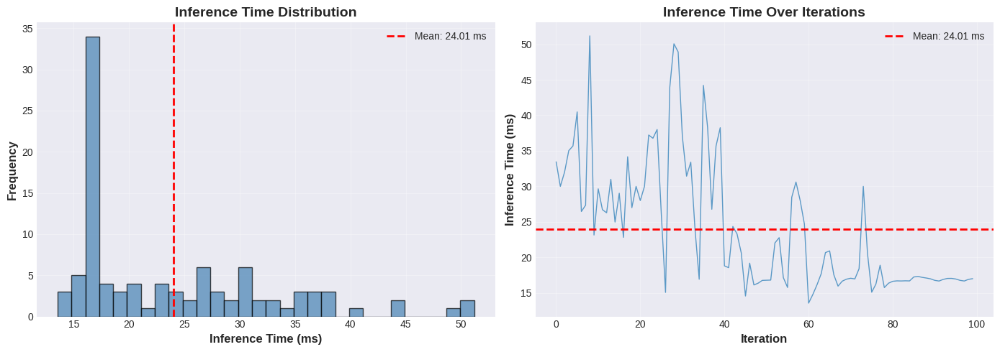


Deployment Considerations:
- Real-time video (30 FPS) requires < 33 ms per frame
- Current model achieves: Real-time capable
- For faster inference: Use smaller input size or lighter encoder


In [28]:
import time

def benchmark_inference(model, device, image_size=512, num_iterations=100):
    """
    Benchmark model inference speed.
    """
    model.eval()

    # Create dummy input
    dummy_input = torch.randn(1, 3, image_size, image_size).to(device)

    # Warmup
    with torch.no_grad():
        for _ in range(10):
            _ = model(dummy_input)

    # Benchmark
    times = []
    with torch.no_grad():
        for _ in range(num_iterations):
            start = time.time()
            _ = model(dummy_input)
            if device.type == 'cuda':
                torch.cuda.synchronize()
            times.append(time.time() - start)

    times = np.array(times)

    # Statistics
    mean_time = times.mean() * 1000  # Convert to ms
    std_time = times.std() * 1000
    min_time = times.min() * 1000
    max_time = times.max() * 1000
    fps = 1.0 / times.mean()

    print(f"Inference Performance Benchmark ({num_iterations} iterations)")
    print(f"{'='*60}")
    print(f"Device: {device}")
    print(f"Image Size: {image_size}x{image_size}")
    print(f"{'='*60}")
    print(f"Mean inference time: {mean_time:.2f} ms ± {std_time:.2f} ms")
    print(f"Min inference time:  {min_time:.2f} ms")
    print(f"Max inference time:  {max_time:.2f} ms")
    print(f"Throughput (FPS):    {fps:.2f} frames/second")
    print(f"{'='*60}")

    # Visualize
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    # Histogram of inference times
    axes[0].hist(times * 1000, bins=30, color='steelblue', edgecolor='black', alpha=0.7)
    axes[0].axvline(mean_time, color='red', linestyle='--', linewidth=2, label=f'Mean: {mean_time:.2f} ms')
    axes[0].set_xlabel('Inference Time (ms)', fontsize=12, fontweight='bold')
    axes[0].set_ylabel('Frequency', fontsize=12, fontweight='bold')
    axes[0].set_title('Inference Time Distribution', fontsize=14, fontweight='bold')
    axes[0].legend()
    axes[0].grid(alpha=0.3)

    # Time series
    axes[1].plot(times * 1000, linewidth=1, alpha=0.7)
    axes[1].axhline(mean_time, color='red', linestyle='--', linewidth=2, label=f'Mean: {mean_time:.2f} ms')
    axes[1].set_xlabel('Iteration', fontsize=12, fontweight='bold')
    axes[1].set_ylabel('Inference Time (ms)', fontsize=12, fontweight='bold')
    axes[1].set_title('Inference Time Over Iterations', fontsize=14, fontweight='bold')
    axes[1].legend()
    axes[1].grid(alpha=0.3)

    plt.tight_layout()
    plt.show()

    return mean_time, fps

# Run benchmark
mean_time, fps = benchmark_inference(model, device, image_size=IMG_SIZE, num_iterations=100)

print("\nDeployment Considerations:")
print("- Real-time video (30 FPS) requires < 33 ms per frame")
print("- Current model achieves:", f"{fps:.1f} FPS" if fps < 30 else "Real-time capable")
print("- For faster inference: Use smaller input size or lighter encoder")

### Performance Benchmarking

Measure inference speed and computational requirements for deployment planning.

In [30]:
!pip install onnx onnxscript

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.2/18.2 MB 91.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 683.0/683.0 kB 59.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.3/129.3 kB 14.5 MB/s eta 0:00:00


In [31]:
import os

# Create models directory
os.makedirs('models', exist_ok=True)

# 1. Save complete model (architecture + weights)
torch.save(model, 'models/unet_resnet34_complete.pth')
print("Complete model saved: models/unet_resnet34_complete.pth")

# 2. Save model weights only (recommended for deployment)
torch.save(model.state_dict(), 'models/unet_resnet34_weights.pth')
print("Model weights saved: models/unet_resnet34_weights.pth")

# 3. Export to ONNX format (cross-platform compatibility)
dummy_input = torch.randn(1, 3, IMG_SIZE, IMG_SIZE).to(device)
torch.onnx.export(
    model,
    dummy_input,
    'models/unet_resnet34.onnx',
    export_params=True,
    opset_version=11,
    do_constant_folding=True,
    input_names=['input'],
    output_names=['output'],
    dynamic_axes={
        'input': {0: 'batch_size'},
        'output': {0: 'batch_size'}
    }
)
print("ONNX model exported: models/unet_resnet34.onnx")

# 4. Save model configuration
model_config = {
    'architecture': 'U-Net',
    'encoder': 'resnet34',
    'encoder_weights': 'imagenet',
    'input_channels': 3,
    'output_classes': 1,
    'image_size': IMG_SIZE,
    'normalization_mean': IMAGENET_MEAN,
    'normalization_std': IMAGENET_STD,
    'threshold': 0.5,
    'best_val_iou': best_val_iou,
    'training_epochs': len(history['train_loss']),
    'total_parameters': total_params
}

import json
with open('models/model_config.json', 'w') as f:
    json.dump(model_config, f, indent=4)
print("Model configuration saved: models/model_config.json")

print("\nModel Export Summary:")
print("="*60)
print("1. PyTorch complete model (.pth) - For PyTorch applications")
print("2. PyTorch weights (.pth) - Lightweight, requires architecture")
print("3. ONNX model (.onnx) - For deployment on various platforms")
print("4. Configuration file (.json) - Model metadata and settings")
print("="*60)

Complete model saved: models/unet_resnet34_complete.pth
Model weights saved: models/unet_resnet34_weights.pth


/tmp/ipython-input-1149903641.py:16: UserWarning: # 'dynamic_axes' is not recommended when dynamo=True, and may lead to 'torch._dynamo.exc.UserError: Constraints violated.' Supply the 'dynamic_shapes' argument instead if export is unsuccessful.
  torch.onnx.export(
W1127 15:39:02.734000 590 torch/onnx/_internal/exporter/_compat.py:114] Setting ONNX exporter to use operator set version 18 because the requested opset_version 11 is a lower version than we have implementations for. Automatic version conversion will be performed, which may not be successful at converting to the requested version. If version conversion is unsuccessful, the opset version of the exported model will be kept at 18. Please consider setting opset_version >=18 to leverage latest ONNX features


[torch.onnx] Obtain model graph for `Unet([...]` with `torch.export.export(..., strict=False)`...
[torch.onnx] Obtain model graph for `Unet([...]` with `torch.export.export(..., strict=False)`... ✅
[torch.onnx] Run decomposition...


[torch.onnx] Run decomposition... ✅
[torch.onnx] Translate the graph into ONNX...
[torch.onnx] Translate the graph into ONNX... ✅


Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/onnxscript/version_converter/__init__.py", line 127, in call
    converted_proto = _c_api_utils.call_onnx_api(
                      ^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/onnxscript/version_converter/_c_api_utils.py", line 65, in call_onnx_api
    result = func(proto)
             ^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/onnxscript/version_converter/__init__.py", line 122, in _partial_convert_version
    return onnx.version_converter.convert_version(
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/onnx/version_converter.py", line 39, in convert_version
    converted_model_str = C.convert_version(model_str, target_version)
                          ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
RuntimeError: /github/workspace/onnx/version_converter/BaseConverter.h:65: adapter_lookup: Assertion `false`

Applied 92 of general pattern rewrite rules.
ONNX model exported: models/unet_resnet34.onnx
Model configuration saved: models/model_config.json

Model Export Summary:
1. PyTorch complete model (.pth) - For PyTorch applications
2. PyTorch weights (.pth) - Lightweight, requires architecture
3. ONNX model (.onnx) - For deployment on various platforms
4. Configuration file (.json) - Model metadata and settings
